
# IceVision BBoxes - (New)Fake Data

*This is a mashup of IceVision's "[Custom Parser](https://airctic.com/0.8.0/custom_parser/)" example and their ["Getting Started (Object Detection)"](https://airctic.com/0.8.0/getting_started_object_detection/) notebooks, to analyze SPNet Real dataset, for which I [generated bounding boxes](https://github.com/drscotthawley/SPNet/blob/master/gen_bboxes_csv.py). -- S.H. Hawley, July 1, 2021*

## Installing IceVision and IceData
If on Colab run the following cell, else check the [installation instructions](https://airctic.com/dev/install/)

In [1]:
# IceVision - IceData - MMDetection - YOLO v5 Installation
#try:
#    !wget https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
#    !chmod +x install_colab.sh && ./install_colab.sh
#except:
#    print("Ignore the error messages and just keep going")

In [ ]:
#all_slow

In [1]:
# system info
import torch, re 
tv, cv = torch.__version__, torch.version.cuda
tv = re.sub('\+cu.*','',tv)
TORCH_VERSION = 'torch'+tv[0:-1]+'0'
CUDA_VERSION = 'cu'+cv.replace('.','')

print(f"TORCH_VERSION={TORCH_VERSION}; CUDA_VERSION={CUDA_VERSION}")
print(f"CUDA available = {torch.cuda.is_available()}, Device count = {torch.cuda.device_count()}, Current device = {torch.cuda.current_device()}")
print(f"Device name = {torch.cuda.get_device_name()}")

TORCH_VERSION=torch1.8.0; CUDA_VERSION=cu102
CUDA available = True, Device count = 1, Current device = 0
Device name = TITAN X (Pascal)


In [3]:
# For local Icevision Install of MMD.  cf. https://airctic.com/0.8.1/install/
#!pip install -qq mmcv-full=="1.3.8" -f https://download.openmmlab.com/mmcv/dist/{CUDA_VERSION}/{TORCH_VERSION}/index.html --upgrade
#!pip install mmdet -qq

## Imports
As always, let's import everything from `icevision`. Additionally, we will also need `pandas` (you might need to install it with `pip install pandas`).

In [2]:
from icevision.all import *
import pandas as pd

INFO     - The mmdet config folder already exists. No need to downloaded it. Path : /home/shawley/.icevision/mmdetection_configs/mmdetection_configs-2.10.0/configs | icevision.models.mmdet.download_configs:download_mmdet_configs:17


## Download dataset

We're going to be using a small sample of the chess dataset, the full dataset is offered by roboflow [here](https://public.roboflow.com/object-detection/chess-full)

In [8]:
# clear out the old version of the data (if it exists)
#!rm -rf  /root/.icevision/data/espiownage-cyclegan

In [3]:
# OLD SPNET Real Dataset link (currently proprietary, thus link may not work)
#data_url = "https://hedges.belmont.edu/~shawley/spnet_sample-master.zip"
#data_dir = icedata.load_data(data_url, 'spnet_sample') / 'spnet_sample-master' 

# can use public espiownage cyclegan dataset:
#data_url = 'https://hedges.belmont.edu/~shawley/espiownage-cyclegan.tgz'
#data_dir = icedata.load_data(data_url, 'espiownage-cyclegan') / 'espiownage-cyclegan'

# or local data already there:
from pathlib import Path
data_dir = Path('/home/shawley/datasets/espiownage-fake')

## Understand the data format

In this task we were given a `.csv` file with annotations, let's take a look at that.

!!! danger "Important"  
    Replace `source` with your own path for the dataset directory.

In [4]:
df = pd.read_csv(data_dir / "bboxes/annotations.csv")
df.head()

,filename,width,height,label,xmin,ymin,xmax,ymax
0,steelpan_0000000.png,512,384,8,135,110,322,287
1,steelpan_0000000.png,512,384,4,399,4,462,103
2,steelpan_0000000.png,512,384,2,20,132,79,211
3,steelpan_0000000.png,512,384,4,353,175,504,254
4,steelpan_0000000.png,512,384,6,75,34,162,105


At first glance, we can make the following assumptions:  

  * Multiple rows with the **same** filename, width, height  
  * A **label** for each row
  * A **bbox** [xmin, ymin, xmax, ymax] for each row  
  
Once we know what our data provides we can create our custom `Parser`.  

In [5]:
set(np.array(df['label']).flatten())

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11}

In [6]:
df['label'] /= 2
#df.head()
df['label'] = df['label'].apply(int) 
print(set(np.array(df['label']).flatten()))
df['label'] = "_"+df['label'].apply(str)+"_"

{0, 1, 2, 3, 4, 5}


In [7]:
df.head()

,filename,width,height,label,xmin,ymin,xmax,ymax
0,steelpan_0000000.png,512,384,_4_,135,110,322,287
1,steelpan_0000000.png,512,384,_2_,399,4,462,103
2,steelpan_0000000.png,512,384,_1_,20,132,79,211
3,steelpan_0000000.png,512,384,_2_,353,175,504,254
4,steelpan_0000000.png,512,384,_3_,75,34,162,105


In [8]:
# ***OR*** we can just make them all the same object:
df['label'] = 'AN'  # antinode
df.head()

,filename,width,height,label,xmin,ymin,xmax,ymax
0,steelpan_0000000.png,512,384,AN,135,110,322,287
1,steelpan_0000000.png,512,384,AN,399,4,462,103
2,steelpan_0000000.png,512,384,AN,20,132,79,211
3,steelpan_0000000.png,512,384,AN,353,175,504,254
4,steelpan_0000000.png,512,384,AN,75,34,162,105


## Create the Parser

The first step is to create a template record for our specific type of dataset, in this case we're doing standard object detection:

In [9]:
template_record = ObjectDetectionRecord()

Now use the method `generate_template` that will print out all the necessary steps we have to implement.

In [10]:
Parser.generate_template(template_record)

class MyParser(Parser):
    def __init__(self, template_record):
        super().__init__(template_record=template_record)
    def __iter__(self) -> Any:
    def __len__(self) -> int:
    def record_id(self, o: Any) -> Hashable:
    def parse_fields(self, o: Any, record: BaseRecord, is_new: bool):
        record.set_filepath(<Union[str, Path]>)
        record.set_img_size(<ImgSize>)
        record.detection.set_class_map(<ClassMap>)
        record.detection.add_labels(<Sequence[Hashable]>)
        record.detection.add_bboxes(<Sequence[BBox]>)


We can copy the template and use it as our starting point. Let's go over each of the methods we have to define:

- `__init__`: What happens here is completely up to you, normally we have to pass some reference to our data, `data_dir` in our case.

- `__iter__`: This tells our parser how to iterate over our data, each item returned here will be passed to `parse_fields` as `o`. In our case we call `df.itertuples` to iterate over all `df` rows.

- `__len__`: How many items will be iterating over.

- `imageid`: Should return a `Hashable` (`int`, `str`, etc). In our case we want all the dataset items that have the same `filename` to be unified in the same record.

- `parse_fields`: Here is where the attributes of the record are collected, the template will suggest what methods we need to call on the record and what parameters it expects. The parameter `o` it receives is the item returned by `__iter__`.

!!! danger "Important"  
    Be sure to pass the correct type on all record methods!

In [11]:
class BBoxParser(Parser):
    def __init__(self, template_record, data_dir):
        super().__init__(template_record=template_record)
        
        self.data_dir = data_dir
        self.df = pd.read_csv(data_dir / "bboxes/annotations.csv")
        #self.df['label'] /= 2
        #self.df['label'] = self.df['label'].apply(int) 
        #self.df['label'] = "_"+self.df['label'].apply(str)+"_"
        self.df['label'] = 'AN'  # make them all the same object
        self.class_map = ClassMap(list(self.df['label'].unique()))
        
    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o
        
    def __len__(self) -> int:
        return len(self.df)
        
    def record_id(self, o) -> Hashable:
        return o.filename
        
    def parse_fields(self, o, record, is_new):
        if is_new:
            record.set_filepath(self.data_dir / 'images' / o.filename)
            record.set_img_size(ImgSize(width=o.width, height=o.height))
            record.detection.set_class_map(self.class_map)
        
        record.detection.add_bboxes([BBox.from_xyxy(o.xmin, o.ymin, o.xmax, o.ymax)])
        record.detection.add_labels([o.label])

Let's randomly split the data and parser with `Parser.parse`:

In [16]:
parser = BBoxParser(template_record, data_dir)

In [17]:
train_records, valid_records = parser.parse()

  0%|          | 0/6923 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:136


  0%|          | 0/1600 [00:00<?, ?it/s]

  0%|          | 0/400 [00:00<?, ?it/s]

Let's take a look at one record:

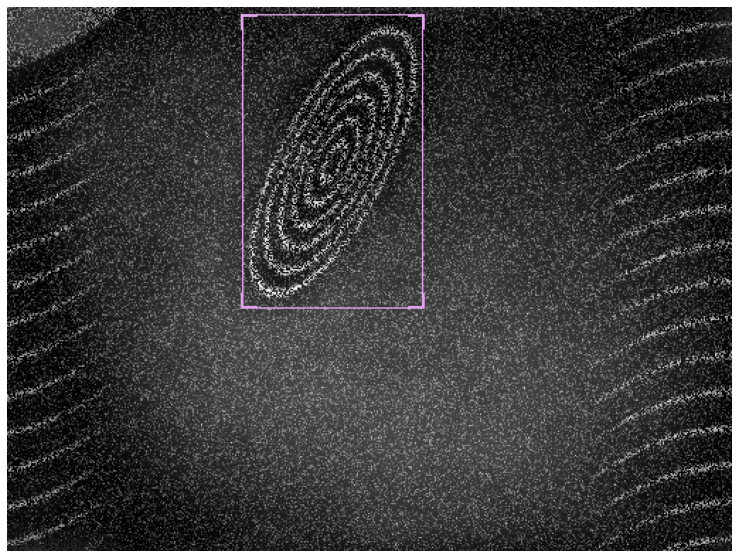

In [18]:
show_record(train_records[5], display_label=False, figsize=(14, 10))

In [19]:
train_records[0]

BaseRecord

common: 
	- Filepath: /home/shawley/datasets/espiownage-fake/images/steelpan_0001026.png
	- Img: None
	- Record ID: 1026
	- Image size ImgSize(width=512, height=384)
detection: 
	- Class Map: <ClassMap: {'background': 0, 'AN': 1}>
	- Labels: [1, 1, 1, 1, 1, 1]
	- BBoxes: [<BBox (xmin:176, ymin:16, xmax:415, ymax:265)>, <BBox (xmin:314, ymin:288, xmax:489, ymax:381)>, <BBox (xmin:15, ymin:60, xmax:166, ymax:217)>, <BBox (xmin:46, ymin:240, xmax:155, ymax:384)>, <BBox (xmin:424, ymin:95, xmax:477, ymax:150)>, <BBox (xmin:419, ymin:163, xmax:506, ymax:252)>]

## Moving On...
*Following the Getting Started "refrigerator" notebook...*

In [20]:
# Transforms
# size is set to 384 because EfficientDet requires its inputs to be divisible by 128
image_size = 384  
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=512), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

# Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

### this next cell generates an error. ignore it and move on

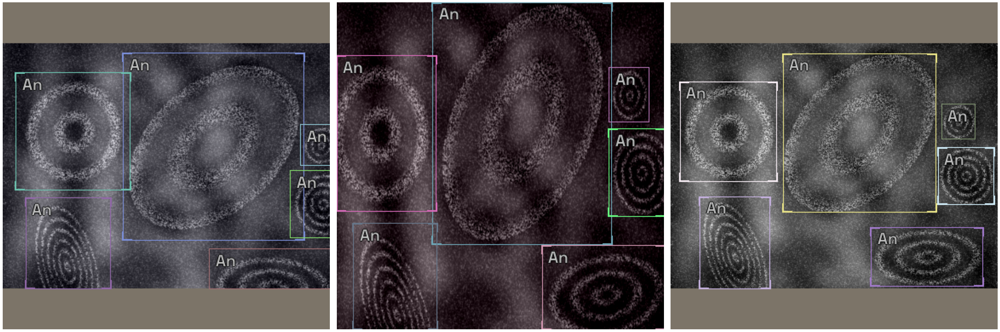

In [21]:
# Show an element of the train_ds with augmentation transformations applied
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3)

In [22]:
model_type = models.mmdet.retinanet
backbone = model_type.backbones.resnet50_fpn_1x(pretrained=True)

In [23]:
# Just change the value of selection to try another model

selection = 1


extra_args = {}

if selection == 0:
  model_type = models.mmdet.retinanet
  backbone = model_type.backbones.resnet50_fpn_1x

elif selection == 1:
  # The Retinanet model is also implemented in the torchvision library
  model_type = models.torchvision.retinanet
  backbone = model_type.backbones.resnet50_fpn

elif selection == 2:
  model_type = models.ross.efficientdet
  backbone = model_type.backbones.tf_lite0
  # The efficientdet model requires an img_size parameter
  extra_args['img_size'] = image_size

elif selection == 3:
  model_type = models.ultralytics.yolov5
  backbone = model_type.backbones.small
  # The yolov5 model requires an img_size parameter
  extra_args['img_size'] = image_size

model_type, backbone, extra_args

(<module 'icevision.models.torchvision.retinanet' from '/home/shawley/envs/icevision/lib/python3.8/site-packages/icevision/models/torchvision/retinanet/__init__.py'>,
 {})

In [24]:
# Instantiate the mdoel
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map), **extra_args) 

In [25]:
# Data Loaders
train_dl = model_type.train_dl(train_ds, batch_size=8, num_workers=4, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=8, num_workers=4, shuffle=False)

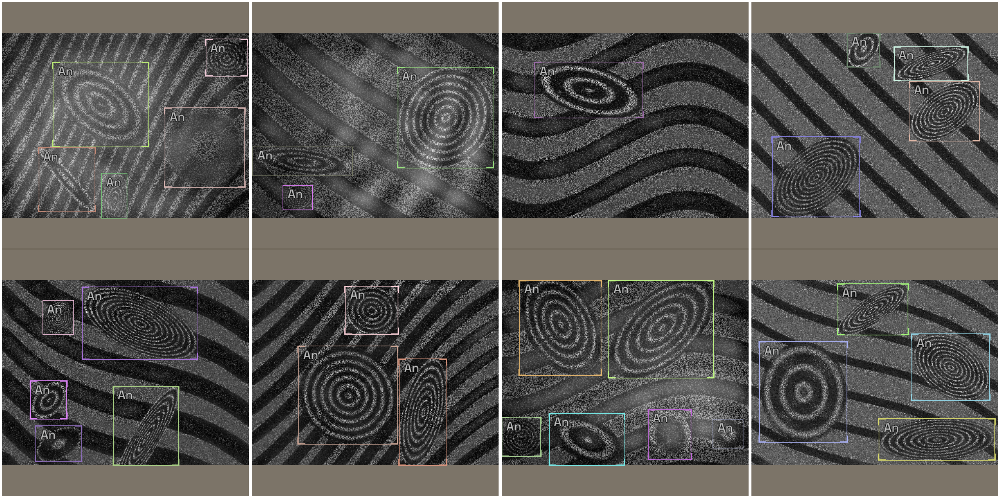

In [26]:
# show batch - target data
model_type.show_batch(first(valid_dl), ncols=4)

In [27]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

In [30]:
# use the fastai bindings
learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

SuggestedLRs(lr_min=1.4454397023655474e-05, lr_steep=0.00010964782268274575)

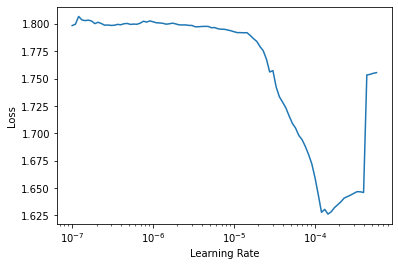

In [31]:
learn.lr_find(end_lr=1e-3)

# For Sparse-RCNN, use lower `end_lr`
# learn.lr_find(end_lr=0.005)

In [32]:
learn.fine_tune(60, 3e-5, freeze_epochs=2)

epoch,train_loss,valid_loss,COCOMetric,time
0,1.306630,1.087196,0.021880,00:44
1,0.915468,0.902527,0.088781,00:44


epoch,train_loss,valid_loss,COCOMetric,time
0,0.791113,0.810303,0.180507,01:03
1,0.737577,0.742241,0.267558,01:03
2,0.682668,0.691719,0.322904,01:03
3,0.622674,0.633965,0.384318,01:03
4,0.567769,0.582195,0.439485,01:03
5,0.527422,0.527512,0.493137,01:03
6,0.484775,0.479645,0.525163,01:03
7,0.458943,0.456298,0.531061,01:03
8,0.427073,0.412692,0.578236,01:02
9,0.396412,0.389732,0.586960,01:02


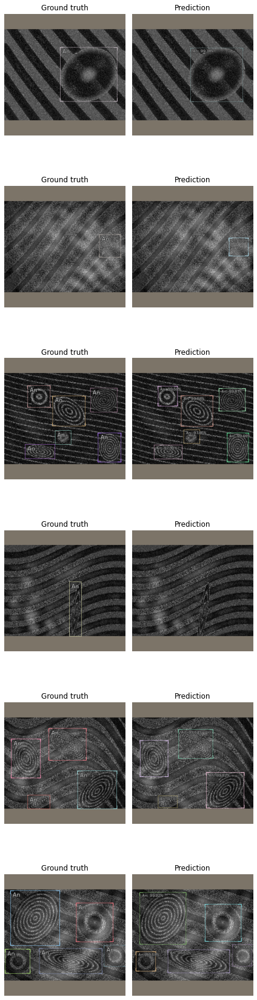

In [33]:
model_type.show_results(model, valid_ds, detection_threshold=.5)

## Inference

In [34]:
preds = model_type.predict(model, valid_ds, keep_images=True)

RuntimeError: CUDA out of memory. Tried to allocate 3.52 GiB (GPU 0; 11.91 GiB total capacity; 5.32 GiB already allocated; 2.94 GiB free; 8.21 GiB reserved in total by PyTorch)

In [ ]:
show_preds(preds=preds[0:10])

In [44]:
len(train_ds), len(valid_ds), len(preds)

(832, 209, 209)

In [ ]:
def get_bblist(pred):
    my_bblist = []
    bblist = pred.pred.detection.bboxes
    for i in range(len(bblist)):
        my_bblist.append([bblist[i].xmin, bblist[i].ymin, bblist[i].xmax, bblist[i].ymax])
    return my_bblist

get_bblist(preds[0])      

In [ ]:
results = []
for i in range(len(preds)):
    #print(f"i = {i}, file = {str(Path(valid_ds[i].common.filepath).stem)+'.csv'}, bboxes = {get_bblist(preds[i])}, scores={preds[i].pred.detection.scores}\n")
    worst_score = np.min(np.array(preds[i].pred.detection.scores))
    line_list = [str(Path(valid_ds[i].common.filepath).stem)+'.csv', get_bblist(preds[i]), preds[i].pred.detection.scores, worst_score, i]
    results.append(line_list)
    
# store as pandas dataframe
res_df = pd.DataFrame(results, columns=['filename', 'bblist','scores','worst_score','i'])
res_df = res_df.sort_values('worst_score')  # order by worst score as a "top losses" kind of thing
res_df.head() # take a look

In [ ]:
res_df.to_csv('bboxes_top_losses_fake2.csv', index=False)